In [1]:

import sys
!{sys.executable} -m pip install astropy
from astropy.table import Table
import numpy as np
import pandas as pd
import scipy as scipy
from scipy import optimize
np.set_printoptions(threshold=np.inf)

In [263]:
dat = Table.read('/Users/edm/Desktop/Gaia data/untitled2.fits', format='fits')
df = dat.to_pandas()
df.columns
print(dat)

     SOURCE_ID              RA         ...        Bp-Rp        
------------------- ------------------ ... --------------------
6311246122674577536  222.3291475982575 ...  -0.5008313000000006
5267418883330985856 108.81763762850414 ... -0.49483500000000014
6443328221136801920 302.27429061923203 ... -0.48364600000000024
6009760034351291904 236.74263152079826 ...  -0.4803879999999978
2521867808229983744  33.02058669246987 ... -0.47616999999999976
3348071631670500736  88.11543730306488 ...  -0.4523130000000002
2338275136195124864 358.26569624310923 ...  -0.4152590000000007
5014009353235167744 17.086327987398764 ... -0.41508699999999976
6616313457820826496 328.72264046712894 ... -0.40558099999999975
6468623688724871808  304.7285032002685 ...  -0.3910899999999984
                ...                ... ...                  ...
5393446658454453632 162.05388771666577 ...             5.153656
2331849006126794880  352.8410547369359 ...             5.167228
 764072693389251456 171.02107012830794 .

In [87]:
fd = pd.read_csv('/Users/edm/Desktop/Gaia data/Untitled2CSV')
print(fd)

                 SOURCE_ID          RA        DEC   PARALLAX         PMRA  \
0      6311246122674577536  222.329148 -14.148557  13.284356   -58.785062   
1      5267418883330985856  108.817638 -70.417724  10.538820  -108.577752   
2      6443328221136801920  302.274291 -60.428789  21.569026   104.597305   
3      6009760034351291904  236.742632 -36.778606  11.260741   -31.208646   
4      2521867808229983744   33.020587   8.780688  12.099630    80.074311   
...                    ...         ...        ...        ...          ...   
82128  1237730036208674048  219.861441  19.489464  70.555084 -1241.000945   
82129  2337628932595588608  357.962107 -25.626022  49.081176   373.991729   
82130  5185493447310441728   42.817452  -3.888260  86.293208  1112.662482   
82131   295725407616670848   25.011339  27.029431  52.602644    60.440949   
82132  6277365908815046912  212.838352 -21.331034  21.926734   -87.883771   

             PMDEC  PHOT_G_MEAN_MAG  PHOT_BP_MEAN_MAG  PHOT_RP_MEAN_MAG  \


In [264]:
df.columns
df['row_num'] = np.arange(len(df))
#gj = df.loc[df['row_num'] == 16]
#print(gj)
#gj = df.loc[df['row_num'] == 13]
#print(gj)


star2 = df.drop(labels=[16,13,24785,302,
75,
20565,
380,
209,
5713,
79,
93,
262,
37,
22,
1902,
104,
3899,
1069,
21101,
1159,
14536,
1406,
294,
5194,
573,
1964,
20620,
1207,
329,
2503,
1741,
6231,
183,
108,
1626,
1361,
927,
7182,
26538,
1411,
974,
978,
1939,
28073,
1343,
140,
103,
1345,
141,
1987,
5118,
134,
2145,
4487,
44922,
22949,
2089,
12619,
1920,
2072,
12193,
2142,
2271,
754,
1318,
1844,
1986,
90,
1094,
7106,
52952,
5541,
27187,
127,
306,
371,
198,
111,
1106,
872,
1814,
767,
1883,
1800,
1892,
5300,
1286,
1633,
3903,
401,
2743,
211,
722,
1753,
1133,
2708,
428,
3657,
1853,
4190,
1635,
136,
3069,
2047,
1468,
1806,
2455,
49,
1611,
1200,
196,
897,
2388,
5921,
178,
2599,
1500,
1891,
2005,
2912,
839,
1270,
928,
1157,
1623,
743,
699,
805,
1134,
1302,
339,
1099,
2566,
3407,
2392,
3353,
312,
164,
1220,
996,
1756,
133,
1630,
1894,
559,
1561,
2397,
1297,
2506,
1289,
1087,
2215,
3906,
257,
38,
8289,
31846,
1506,
2784,
1501,
1109,
4145,
2444,
36,
2287,
123,
1035,
2511,
1888,
1402,
1553,
1480,
244,
949,
1114,
1084,
745,
129,
2136,
3768,
1415,
2353,
1040,
1936,
2524,
1050,
4542,
20,
3681,
1770,
189,
181,
1407,
263,
179,
223,
354,
132,
827,
40,
13519,
1240,
18025,
2006,
382,
195,
171,
226,
3234,
59,
98,
25,
1149,
39,
1616,
2026,
268,
2604,
602,
188,
2204,
1664,
2603,
2721,
2172,
4104,
922,
2076,
1232,
64,
1426,
1398,
535,
1504,
2095,
1404,
51,
1280,
1556,
1446,
324,
2458,
2975,
1077,
42871,
1205,
3702,
1295,
979,
112,
7436,
2358,
687,
161,
1849,
125,
2501,
494,
236,
20315,
2320,
711,
1184,
1006,
1762,
1736,
148,
3257,
822,
1695,
1667,
2488,
1293,
1265,
2865,
3412,
31241,
2028,
1540,
887,
62,
36911,
1012,
2102,
6086,
24668,
1657,
2521,
961,
296,
159,
2127,
1864,
1515,
1422,
249,
201,
1691,
1029,
1487,
1584,
23638,
596,
424,
1948,
3811,
885,
715,
1941,
896,
1370,
1884,
1579,
279,
168,
18,
2580,
1342,
2043,
229,
1676,
19900,
101,
1070,
2538,
980,
2255,
1933,
180,
4571,
634,
2761,
2833,
773,
2001,
137,
2046,
497,
916,
763,
217,
2203,
1201,
1526,
2660,
786,
322,
3201,
736,
386,
683,
843,
44,
1022,
282,
1210,
170,
96,
1016,
165,
88,
769,
289,
46,
35,
2229,
17420,
363,
34720,
1759,
28759,
174,
42,
619,
84,
71,
1641,
6,
512,
252,
898,
12,
3514,
772,
29,
273,
250,
9116,
172,
432,
2621,
983,
1371,
1605,
1281,
7027,
1475,
1151,
255,
63,
1462,
119,
15295,
303,
1575,
346,
935,
2149,
484,
343,
65,
4,
301,
939,
671,
2406,
936,
1168,
1518,
4152,
304,
34,
835,
1908,
17,
1315,
121,
2821,
276,
1492,
1801,
1075,
836,
11795,
1325,
2114,
4251,
157,
3322,
15078,
149,
965,
4325,
675,
1067,
15,
1609,
485,
114,
105,
130,
2135,
9758,
32113,
86,
1654,
1172,
1962,
1773,
10210,
10770,
109,
11992,
458,
1799,
1862,
185,
222,
1567,
1621,
31,
5444,
116,
12623,
85,
1277,
616,
3055,
3352,
55,
2748,
251,
54,
1429,
266,
305,
307,
26271,
511,
274,
319,
1052,
26822,
5155,
241,
4416,
2303,
284,
4425,
77,
1956,
23,
1323,
219,
425,
364,
169,
372,
288,
2291,
1310,
768,
1150,
357,
206,
41,
5,
117,
78,
718,
11,
50,
95,
975,
1303,
267,
19,
278,
443,
1503,
13954,
66,
29321,
590,
429,
349,
1036,
234,
2278,
83,
2611,
1095,
115,
97,
184,
61,
1269,
2214,
538,
2085,
882,
2557,
368,
1628,
2737,
1322,
194,
2020,
2378,
155,
757,
604,
4157,
225,
1547,
420,
947,
446,
2144,
1677,
1447,
173,
118,
2035,
828,
2526,
724,
515,
199,
89,
472,
25014,
48,
1001,
56,
213,
33,
1390,
1796,
100,
4399,
1000,
2765,
1458,
135,
248,
142,
1367,
610,
1812,
285,
3031,
2237,
245,
1204,
23050,
2703,
374,
216,
1443,
1893,
260,
60,
1721,
27,
764,
742,
643,
113,
26709,
1521,
1559,
42283,
2165,
2208,
2901,
1719,
1525,
2059,
1618,
582,
2042,
158,
314,
2338,
1610,
414,
521,
1177,
1996,
2409,
1548,
1489,
977,
4312,
1441,
2265,
2610,
1086,
74,
5770,
76,
1460,
2167,
823,
2108,
2188,
176,
818,
18039,
4282,
5400,
681,
1509,
18614,
57,
120,
10,
2060,
804,
2040,
122,
144,
393,
215,
2312,
703,
3339,
1112,
1217,
9641,
862,
167,
231,
126,
20909,
190,
761,
840,
80,
270,
152,
465,
5084,
1340,
1242,
1881,
2866,
32,
203,
1335,
348,
24063,
379,
1054,
107,
92,
1175,
33058,
1045,
5225,
10837,
705,
131,
14,
507,
281,
325,
72,
311,
30,
377,
1351,
154,
7,
106,
128,
259,
210,
47,
52,
813,
28,
21,
26,
214,
146,
2103,
879,
24099,
287,
43,
543,
162,
1818,
2094,
678,
1968,
2428,
156,
1,
204,
685,
177,
1057,
29516,
21064,
58,
227,
1464,
110,
1189,
3,
69,
528,
874,
53,
182,
628,
247,
471,
238,
145,
963,
16441,
469,
782,
353,
1718,
1025,
82,
94,
70,
124,
2,
67,
9,
143,
228,
102,
138,
68,
8,
81,
359,
24,
208,
794,
153,
870,
187,
45,
1601,
1338,
1021,
6584,
40594,
2030], axis=0)
print (star2)


#this is the source that returned largest area NANS could be contributing to large impulse

                 SOURCE_ID          RA        DEC   PARALLAX         PMRA  \
0      6311246122674577536  222.329148 -14.148557  13.284356   -58.785062   
73     6105713692544123520  220.489793 -37.793636  10.033936   -29.827558   
87     6061204980842862336  191.594373 -56.488883   9.732631   -33.626624   
91     6125166320994675456  182.912716 -52.368499  12.469230   -38.873766   
99     3237714611660197632   82.696088   5.947973  10.142818     9.365507   
...                    ...         ...        ...        ...          ...   
82128  1237730036208674048  219.861441  19.489464  70.555084 -1241.000945   
82129  2337628932595588608  357.962107 -25.626022  49.081176   373.991729   
82130  5185493447310441728   42.817452  -3.888260  86.293208  1112.662482   
82131   295725407616670848   25.011339  27.029431  52.602644    60.440949   
82132  6277365908815046912  212.838352 -21.331034  21.926734   -87.883771   

             PMDEC  PHOT_G_MEAN_MAG  PHOT_BP_MEAN_MAG  PHOT_RP_MEAN_MAG  \


In [265]:
gj = df.loc[df['row_num'] == 5806]
print(gj)

                SOURCE_ID          RA        DEC   PARALLAX        PMRA  \
5806  6541741997949120512  347.487021 -42.861325  28.918182 -317.387006   

          PMDEC  PHOT_G_MEAN_MAG  PHOT_BP_MEAN_MAG  PHOT_RP_MEAN_MAG  \
5806 -18.753432         5.777673          5.952077          5.305983   

      ADOPTEDRV   DIST_50   UVEL_50    VVEL_50     Bp-Rp  row_num  
5806  14.690328  0.034577  52.07547  12.891995  0.646094     5806  


In [269]:
gj = df.loc[df['row_num'] == 25624]
print(gj)

                 SOURCE_ID          RA        DEC   PARALLAX       PMRA  \
25624  1139846803822564608  104.751258  77.160555  15.779488 -30.135419   

           PMDEC  PHOT_G_MEAN_MAG  PHOT_BP_MEAN_MAG  PHOT_RP_MEAN_MAG  \
25624  19.020301         9.601206         10.017639          9.018861   

       ADOPTEDRV   DIST_50   UVEL_50   VVEL_50     Bp-Rp  row_num  
25624   2.065482  0.063373  0.172608  8.587488  0.998778    25624  


In [4]:
Star = Table.read("/Users/edm/Desktop/Gaia Data/Original/Table3_ResolvedStellarSystems.fits", format='fits')
print(Star)

     sourceID1           sourceID2      separation ...  coma hyades bound
                                          arcsec   ...                   
------------------- ------------------- ---------- ... ----- ------ -----
     83154862613888      83154861954304     3.8353 ... false  false true 
    554329954689280     554329954689152     3.7164 ... false  false true 
   1611029348657664    1611029348487680     6.1252 ... false  false true 
   1950331764866304    1962117155125760     9.3117 ... false  false true 
   1950331764866304    1962117155125888    11.6604 ... false  false true 
   1962117155125888    1962117155125760     2.7914 ... false  false true 
   2048493242810496    2048497537393792     1.6040 ... false  false true 
   2058736739430272    2058736739430144    21.2564 ... false  false true 
   2769330488563712    2769330487975040     1.8195 ... false  false true 
   3041665774826112    3041665774825984     2.8693 ... false  false true 
                ...                 ..

In [131]:
g = np.asarray([1611029348657664, 6913810483612308480])

In [209]:
g = np.asarray([12254267546754176, 14141304376849280, 17033153101264640, 36207059639735296, 39305036729495936, 49013483883923968, 59077760488621184, 59370127502651264, 61497407625478272, 67620897117741440, 75783121685634816, 90076974709491968, 91690164426711040, 98075028448822656, 98092934167683072, 114851999635497344, 181170585358665088, 190998058945380608, 290678477446232960, 291057843317534464, 379359102453525376, 418491412783587200, 470826482637310848, 495058241441193728, 518201792978858880, 575658456708126208, 577026966432521088, 582509956042253312, 582729312907277568, 583533124626862464, 583995091309178624, 584402318633098624, 587767202170593536, 588332900903805824, 588349771535238912, 588349805894986624, 588813460499195264, 591040864898749312, 591207406550605312, 592019425952313600, 592605431290049152, 597646245427109376, 610478649930041856, 627412945768300800, 642685200933153408, 651337945128014720, 674479430781455872, 677196843705878272, 677560232299128192, 679723276611814400, 681934703732973824, 684598618544000384, 687914432080614528, 692134636881870208, 701307621874580864, 701552327634833280, 710392886455231360, 710452358868303232, 710766750855439360, 711260465552649216, 712888090655562624, 715437789400182016, 716112442863454464, 716504796716020352, 717203467636317056, 717762977319125632, 723361209490895744, 740483560857296768, 750713313579071232, 752814274140797568, 753840603821390848, 759980585988726912, 761480972683472384, 762814371050472448, 764086604787758208, 771045212017101952, 771517005584473600, 777512951728187392, 778707154499553792, 779223787525884928, 780429608184054912, 782378320745502336, 783921244796958208, 787923780658695680, 788592386816314752, 793575201703625984, 798566915774818176, 798602271945568256, 802299925252613376, 803211596486728064, 805470233890349440, 807280785942808320, 811237923994639744, 812202337427426304, 815429197896495104, 819574013135499776, 820169737983275904, 823393402996648960, 823631692078674816, 826340923089047296, 826954824238274048, 829430275896907904, 833452873535333760, 833470465721350784, 834234385783616640, 836823151552466304, 837242890116333312, 838295294542456448, 840622479622035712, 842498482680906496, 842504358196167680, 842958082837662080, 843807902246527232, 845973046799769984, 845982667526493440, 847884509109410816, 852433880203843712, 852604201427010816, 855361055035055104, 855387061061127168, 855892153511070080, 857165662854257792, 859082970614616448, 862185002154275968, 862260868456553856, 864111582748403968, 867440427218037120, 867848380391409408, 876303109412500352, 876571935709366272, 879383936697674496, 880840789603989504, 894957694270675584, 900182131145007104, 905370726516920704, 905923368548465152, 906160863060179072, 906771229452899584, 906775593140073344, 906922545445227648, 908364559240386944, 908957092928687104, 910341618586847232, 912718071240545152, 915672081021495552, 916276228300814976, 917321936874346880, 922686832063591168, 923023248261420672, 924219890574729856, 927205339521671552, 928079146323608320, 928937074630507392, 929774314079963264, 931487524994983808, 932855386179190272, 933057593239584000, 933095015289999872, 934555334235313664, 934937139647967232, 943770757800160384, 946030529073021440, 964341830081964416, 1009518284670371840, 1011870071322756096, 1013058162355432832, 1014548520302641536, 1014793672740325248, 1016617865610081152, 1019874314110122368, 1020158400426591872, 1020653077580086784, 1021408850089922560, 1022128244227188224, 1022470261063639808, 1027704894188127232, 1030381796981255936, 1038076351151065088, 1038500174228188416, 1047132925349510784, 1049324629980448256, 1050825733935333376, 1050892563625773184, 1051954485699665280, 1055273537642488576, 1058284412796260480, 1067716813814487296, 1070600145618332160, 1154004081179409920, 1154456216681249536, 1158347014670132864, 1161215296909017728, 1163912467652160896, 1176717792385803136, 1176899898999183360, 1179764607826002688, 1192764133804981376, 1193520666521113344, 1193974077628437760, 1199192840852373376, 1202552914026910976, 1209640499120458752, 1219876887953177600, 1221075080749770752, 1228266814506156928, 1257923215792065152, 1261751715280478848, 1261923724426167168, 1281410781322153216, 1289020673097509760, 1289986903300047744, 1295170344710806400, 1299314816353108992, 1302697738753921536, 1305852233317101184, 1306197930941817984, 1310256365798876032, 1311660540930405632, 1313265900922425856, 1316238426312036096, 1316607896578157824, 1323407624377828224, 1325705942981586176, 1331106782752978688, 1332001785217988992, 1334374153353733888, 1334770870892758912, 1355979969155873792, 1369772925913456768, 1369861200377513088, 1380443823700583552, 1382375154530149248, 1384982332821602560, 1387655524762487552, 1390295486540598656, 1391331222197901696, 1392065975139109504, 1394045267867814400, 1397229487901500928, 1397791368407211264, 1400157173832960384, 1401010605309570816, 1402721307964211072, 1404831472640252928, 1410897688745546752, 1411292580922301312, 1422012892308493568, 1431176943768691328, 1432420624562923520, 1438252232373823360, 1438843215578245888, 1439283711720415872, 1470849350522703488, 1471788161655374080, 1474090607723007104, 1481311753417900160, 1483371791532150784, 1485197354494658176, 1487362258530962944, 1492278518615941504, 1493934284343845504, 1494485758144731520, 1497899703093177728, 1498271376679465600, 1498271406743008640, 1498447607777405312, 1500444625834675200, 1501012287368950528, 1502063317405058304, 1502284452385828864, 1503808066264043136, 1504083322128011648, 1504453896202493568, 1511457265578685440, 1512752769450543488, 1512865022715710464, 1515693894335906688, 1517760529518658560, 1518373537314807552, 1522443933657255936, 1527940564084210816, 1529609897612606592, 1534384148897669248, 1537794524729363712, 1538625407627245056, 1542933401563275136, 1543370904111505408, 1543723709905857792, 1544285079309656064, 1544707665434144640, 1546270625515781248, 1549208138324951936, 1550602907481860480, 1551062778220116992, 1551402252435630592, 1554843655110340992, 1555883930548870400, 1557524191442926336, 1558872261424381184, 1561389253988468224, 1561515526026874624, 1565012935076040832, 1566012013187728768, 1566553007268519168, 1566603962760532736, 1568579647717853184, 1570797397030578048, 1571109898850692608, 1572216243769902336, 1573121554156399872, 1577900791900994688, 1578748858964566400, 1579147088331814144, 1583023618437189504, 1583921850718408960, 1584734595969095424, 1585063422960992256, 1586427298416103296, 1586838374030594048, 1600172155835980800, 1600882268549215616, 1602106540386957184, 1604147165248626048, 1607738921843325440, 1608061254844374784, 1608497864040134016, 1610657197502002048, 1612074918962152192, 1613862480054872320, 1618920714579089280, 1631186458277453440, 1631578537252535040, 1631669453120152192, 1632041328568823424, 1632472715084508800, 1641386833807056640, 1645204475617697536, 1658578797618935680, 1659211974581862912, 1661023419988816256, 1662524184641472640, 1663349849153677952, 1663956268471724288, 1665858350572796672, 1666378698746614528, 1670992421335403904, 1671329451713079808, 1672147149062665472, 1682417167486191360, 1686708050268594944, 1741417790361772160, 1742342784582615936, 1748922296525519872, 1750545141328217984, 1765090584946772736, 1766620929036759808, 1766702297192943488, 1793946026371051648, 1794118516552814336, 1815528000815020288, 1831553382794173824, 1879147564661258240, 1898875311527105152, 1939308236730745472, 1970054533224387072, 1977417206686680704, 2105736948138593280, 2286958798223194624, 2310942857676734848, 2315346161227820032, 2323704339384503040, 2334079090586541440, 2336189396997071616, 2337472660210623488, 2338275136195124864, 2338349628107880192, 2361264618662161920, 2364319061964016512, 2372473658671416960, 2377643661128402048, 2379201119352265472, 2393546245693497728, 2394715198352621696, 2395444208921491456, 2408844399510334464, 2414099622710507904, 2416481783371550976, 2422442334689173376, 2424880574738721408, 2425347347488993408, 2437760730687096192, 2467788122659245696, 2471521269578009984, 2473296504116465408, 2473754897386327808, 2473843786029439104, 2476337856358290560, 2477282538708615680, 2480731779699826176, 2485211533668928640, 2488960249844340352, 2497895053130247040, 2501224305619721984, 2503828498910129664, 2506507630789788032, 2510891108771852416, 2511623211717232640, 2516322146457318144, 2521867808229983744, 2529237113117694336, 2543230185287345664, 2544456862306151680, 2545305410405677312, 2545505281002947200, 2546887573277984256, 2552121179905893888, 2552928187080872832, 2558736322894795648, 2567944320460595840, 2569277680172652928, 2574848772446200960, 2581380077674117120, 2585189473147457408, 2585306399337120128, 2586182156053386240, 2587268134239449728, 2587491678697364224, 2588874825669925504, 2591091789004351104, 2595728287804350720, 2605271846869877632, 2608247533357159424, 2609067704606647680, 2610488514148351360, 2615150512169240832, 2615280147167407104, 2621565333592122496, 2625750938132516224, 2630076966632012160, 2630264429069509888, 2633120655335891968, 2652784694950778624, 2654170736729886976, 2657451056656635648, 2660358032257156736, 2661500871515095680, 2664365374183501312, 2666976508140663040, 2667108891917960960, 2670770991487735424, 2675503117734361344, 2677321641247692032, 2677851743291189888, 2687768066863960576, 2688986325747403264, 2689129601561746560, 2689915958535673472, 2690911738111175936, 2709363196787375488, 2711324446359728384, 2719012579552367488, 2730508416002618752, 2730989658498251776, 2731501687319341568, 2731502443233585280, 2731772377633104128, 2731922422315395968, 2734319087081051264, 2745244002118134400, 2756675044691990272, 2762076666146759040, 2762605088857836288, 2768116146078155648, 2769930207121379968, 2780524585769652736, 2781012734572656640, 2789398778477164672, 2792315366213367296, 2811363550466857344, 2811882073278282496, 2813447365520332672, 2814942392095501952, 2816082757452460416, 2825795087259417984, 2826254713186397440, 2842650153836732928, 2856257606661059456, 2871730307948650368, 2918665577420228480, 3067956368587354368, 3079104660578372480, 3080411881119844736, 3117320802840630400, 3145766676180517760, 3171373722173234048, 3175193288128400896, 3179499250541535744, 3189621320226676736, 3191269144559159936, 3197508598168785408, 3202808828330265088, 3238868171156736768, 3249740657527506048, 3251748915515143296, 3262366899304566272, 3262674487682440448, 3263484003117848832, 3266576684513815168, 3273645105468368000, 3274761620869767168, 3297249936488848384, 3302846072717868416, 3306722607119077120, 3348071631670500736, 3348917053032143616, 3350123251647482624, 3367112974037883904, 3370342445848382080, 3466326581136347520, 3474544434121450496, 3482983495102507904, 3489719481290397696, 3491050989871968768, 3523347735187987072, 3528847870307147136, 3541237717085787008, 3552845261339955200, 3554395813252626048, 3557394009663078912, 3557916273390162560, 3570694595665791232, 3571559292842744960, 3574739561506431104, 3575770010060921728, 3586028453547223552, 3601778888894719616, 3603920565746668032, 3610422798340344704, 3623233040812235904, 3628421666247974016, 3629976620502866944, 3630035787972473600, 3634151534873010176, 3637209066255998592, 3638457669084084224, 3642258577702062720, 3645620879964502016, 3647875570291353344, 3648744214542134912, 3650552739370519680, 3651747667992161920, 3652390092020688128, 3653562656746977792, 3653928313083020416, 3658879826259633664, 3659054987910568320, 3659347256140256256, 3659914737283635840, 3660356573454829824, 3660622479174640640, 3660691817127057920, 3661954022115425536, 3662011643397066112, 3662779171232754688, 3663900436870097664, 3668476222012308480, 3669065354086975872, 3669400430255790336, 3674476639217656576, 3679712857186869504, 3682412703692940032, 3682835848166848896, 3683627840135415808, 3689027026344014464, 3690323316193465344, 3690709554012428416, 3692337037379978112, 3693488019896536704, 3694399755554510720, 3695495693769418112, 3696778892558087552, 3698872156539379968, 3701701509194344576, 3705070756419217408, 3708253980021111168, 3708366954839619328, 3712812452150011648, 3716300103033172608, 3724279563857965184, 3725570772761744384, 3736695803210593664, 3738752645868410752, 3739031165907785216, 3788194488314248832, 3794255335708201984, 3794415245931016320, 3800902265750001664, 3804239558419007744, 3806277464565712256, 3809230860172408320, 3809362934711715712, 3810397128476695424, 3810552434493888768, 3810866241985029120, 3810933247769901696, 3811876594386673408, 3815759279181364864, 3818473629793533312, 3825160133663597440, 3829366074878263168, 3830623164560911872, 3830680854561582464, 3830990156631488128, 3832329434808415744, 3833982271367482624, 3834721387994870784, 3834915417437497088, 3836605980989228928, 3840946062621774592, 3841045053027974912, 3843483151343659776, 3844051225193053440, 3846557660732848384, 3847322577227869952, 3848159236857539584, 3850056169293341824, 3850381865253059328, 3852118307646195328, 3852926238238732928, 3853660510143027200, 3855631797052747136, 3855792630692650112, 3857118439852847744, 3859871342090899328, 3860381618565361024, 3860625435268868864, 3860751256335185408, 3862830334039617408, 3864754303293985792, 3871736820606012928, 3874412413432647680, 3875652014008894720, 3875789001991057536, 3876618892751168000, 3880219037418284160, 3881473820703514752, 3883746133280920448, 3886816622581111552, 3888723386196630784, 3896442675083660288, 3900013579612540672, 3905534918987016576, 3906450326840122368, 3907977484067188096, 3908299636678454784, 3915026861134449664, 3916712206301454720, 3917811443050820736, 3919950955240152832, 3930922058356114560, 3931751257626586880, 3933031020441648384, 3940955205038857728, 3966519331420622080, 3974868644764927744, 3978879594463300992, 4005438916307756928, 4016142868162408576, 4017694519587168128, 4021565827014024576, 4149820323678136192, 4154963942133386880, 4231193525645520768, 4248931504366754304, 4249667902270614272, 4257461275049675008, 4280632829779587072, 4301829970867752704, 4313658585693385984, 4319908862597055232, 4320094439580536320, 4330093466990008448, 4340322876499078400, 4347700805681797120, 4401558183740868480, 4402583306535868544, 4403768373911022080, 4410623858974488832, 4415725940820061824, 4415799779897925760, 4416948833973175168, 4417527967363383680, 4420124124769394176, 4421098773108860928, 4425127624234553984, 4426435871273922560, 4429106481934491136, 4435778215414219520, 4447022061837071744, 4447152865064276736, 4454017257893306496, 4458207634145130368, 4460086458999242368, 4465105351622152704, 4485626636646013696, 4497414466452138496, 4565048312887877888, 4565386996828484224, 4573071139998034048, 4645960583300470656, 4646535078125821568, 4716787274071022848, 4766810380210581632, 4833967725801565696, 4873109308958466432, 4922382445088509312, 4940662032058418944, 4962193390308361728, 4964509614631078272, 4994877094997259264, 5005361213245945856, 5014009353235167744, 5020146620982523008, 5026963661794939520, 5027351170924256512, 5034051079388141696, 5037875455706805504, 5043926824108837376, 5055975238166788352, 5063539946887524864, 5075443981321647744, 5078074837769743744, 5083966055431334912, 5088334621288740992, 5089065654786155904, 5100053078775660160, 5111719820563572096, 5122528470836031232, 5132580858972702976, 5135466183642594304, 5168944835239726080, 5168947721457740288, 5169733318219971968, 5176159517007960576, 5180178266367085312, 5180494685197598464, 5187346124402986752, 5267418883330985856, 5353122722363361920, 5453248339973753216, 5536077746353130240, 5639391810273308416, 5652718097353105664, 5655188871777035520, 5667957225433304192, 5685624040829463552, 5717278911884258176, 5740410334419524864, 5850533227210203520, 6009760034351291904, 6070021243006871040, 6127333286605955072, 6177238676273826304, 6182345731690327808, 6182607385393358848, 6191268135405788544, 6194788080147917824, 6233522951380817152, 6259147585259050496, 6265082680310200448, 6275184065428686464, 6296317052576778240, 6301064404482150912, 6318882711964895872, 6319913126159509888, 6329136310728635776, 6338811188419479040, 6364918198670588928, 6394778525002127104, 6422236358302245248, 6424566979354709248, 6443328221136801920, 6446197877766956800, 6468623688724871808, 6514042654346344704, 6520516480027596288, 6530974072557448064, 6575491133702739584, 6578616598584224640, 6616313457820826496, 6621374578563035776, 6621832284637642240, 6753413448178338944, 6836795672680406272, 6842831888437047680, 6849796229451135104, 6853784501721502720, 6865430941202657408, 6876934409805839872, 6898489884295407488, 6907031749613795968, 6907108371830928768, 6909994246262080000, 6913810483611035776, 6917473674103954560])
for i in g:
    df['row_num'] = np.arange(len(df))
    K = df.loc[dat['SOURCE_ID'] == i]
    h = K['row_num']
    u = np.asarray(h.T)
    converted_2list = [str(element2) for element2 in u]
    joined_2string = ", ".join(converted_2list)
    print(joined_2string)
    #d = np.asarray([joined_2string])
    
    
    
    
    
    

302
75
20565
380
209
5713
79
93
262
37
22
1902
104
3899
1069
21101
1159
14536
1406
294
5194
573
1964
20620
1207
329
2503
1741
6231
183
108
1626
1361
927
7182
26538
1411
974
978
1939
28073
1343
140
103
1345
141
1987
5118
134
2145
4487
44922
22949
2089
12619
1920
2072
12193
2142
2271
754
1318
1844
1986
90
1094
7106
52952
5541
27187
127
306
371
198
111
1106
872
1814
767
1883
1800
1892
5300
1286
1633
3903
401
2743
211
722
1753
1133
2708
428
3657
1853
4190
1635
136
3069
2047
1468
1806
2455
49
1611
1200
196
897
2388
5921
178
2599
1500
1891
2005
2912
839
1270
928
1157
1623
743
699
805
1134
1302
339
1099
2566
3407
2392
3353
312
164
1220
996
1756
133
1630
1894
559
1561
2397
1297
2506
1289
1087
2215
3906
257
38
8289
31846
1506
2784
1501
1109
4145
2444
36
2287
123
1035
2511
1888
1402
1553
1480
244
949
1114
1084
745
129
2136
3768
1415
2353
1040
1936
2524
1050
4542
20
3681
1770
189
181
1407
263
179
223
354
132
827
40
13519
1240
18025
2006
382
195
171
226
3234
59
98
25
1149
39
1616
2026
268
2604
602

In [5]:
#star2 = Table.read("/Users/edm/Desktop/untitled2.fits", format='fits')
#print(star2)

In [216]:
Star3 = Table.read("/Users/edm/Desktop/Gaia Data/Original/Hyades_ComaBer.fits", format='fits')
print(Star3)

      source_id         name  c_cluster dist_cluster
                                             pc     
--------------------- ------- --------- ------------
  3312644885984344704 Hyades      0.574        0.741
  3313285110990793472 Hyades      0.115        0.749
  3314137846679343872 Hyades      0.239        0.943
  3312536927686011520 Hyades      5.601        0.958
  3312904233289409152 Hyades      0.330        1.072
  3314109916508904064 Hyades      2.306        1.091
  3313173957237081984 Hyades      0.562        1.143
  3313751441358252160 Hyades      2.621        1.148
  3312709379213017728 Hyades      0.078        1.181
  3314212068010812032 Hyades      0.274        1.232
                  ...     ...       ...          ...
  1260123858250996608 ComaBer     2.377       35.203
  1259987931126020736 ComaBer     1.170       35.518
  1453164564983764224 ComaBer     6.979       36.220
  1285098955638193792 ComaBer     1.078       37.766
  1284742920029261312 ComaBer     9.249       

 Note (1) Dimensionless chi-square test statistic. Small values indicate highly  [astropy.io.fits.card]


In [217]:
#Star4 = Table.read("/Users/edm/Desktop/Gaia Data/Original/distance_PDF.fits", format='fits')
#print(Star4)

In [218]:
print(Star.colnames)

['sourceID1', 'sourceID2', 'separation', 'magDiff', 'projSep', 'binary', 'coma', 'hyades', 'bound']


In [219]:
#print(star2.colnames)

In [220]:
print(Star3.colnames)

['source_id', 'name', 'c_cluster', 'dist_cluster']


In [221]:
#turns each into usable arrays
#radial velocity
Rvel = np.asarray(star2["ADOPTEDRV"])
print(Rvel)
#median x velocity
MVx = np.asarray(star2['UVEL_50'])
print(MVx)
#median y velocity
MVy = np.asarray(star2['VVEL_50'])
print(MVy)
#Proper Motion Dec
PMD = np.asarray(star2['PMDEC'])
print(PMD)
#proper motion RA
PMR = np.asarray(star2['PMRA'])
print(PMR)
#parallax
Para = np.asarray(star2['PARALLAX'])
print(Para)
#median distance
med_d = np.asarray(star2['DIST_50'])
print(med_d)
#median velocity
med_v = np.sqrt(MVx**2+MVy**2)
Rp = np.asarray(star2['PHOT_RP_MEAN_MAG'])
print(Rp)
Bp = np.asarray(star2['PHOT_BP_MEAN_MAG'])
print(Bp)
Mg = np.asarray(star2['PHOT_G_MEAN_MAG'])
print(Mg)

[ 7.00000000e-01  2.60000000e+00  1.66000000e+01  1.50000000e+01
  1.86000000e+01 -1.55000000e+01  2.05000000e+01  4.20000000e+01
  2.16000000e+01  2.30000000e+01  3.19640000e+01  3.30000000e+00
  1.24000000e+01  1.40000000e+01  1.40000000e+01  3.99360000e+01
 -2.00000000e-01 -2.00000000e+00  2.35000000e+01  2.55000000e+01
 -1.10000000e+00  4.00000000e-01 -7.00000000e-01  1.80480000e+01
 -3.00000000e+01  4.70000000e+01 -1.90000000e+01  1.51000000e+01
  2.10000000e+01  2.50000000e+01  6.10000000e+00  2.90000000e+01
  1.57000000e+01  1.04000000e+01  1.34000000e+01  9.50000000e+00
 -5.50000000e+00  2.43000000e+01 -1.90000000e+01 -1.90000000e+00
  7.30000000e+00 -1.27000000e+01  2.05000000e+01  2.00000000e+01
 -9.00000000e+00  1.70000000e+01  3.09000000e+01  1.40000000e+01
 -9.00000000e+00  2.20000000e+01 -1.65000000e+01 -2.90000000e+00
 -1.30000000e+01 -8.30000000e+00 -7.20000000e+00 -2.18000000e+01
 -2.00000000e+00  1.76000000e+01  1.36000000e+01  1.00000000e+00
 -2.00000000e-01  5.50000

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.07527728 0.09991849 0.10291942 0.08043926 0.09856627 0.09857627
 0.10063451 0.09816146 0.10900935 0.09362658 0.10044954 0.07343549
 0.0877016  0.09835714 0.09819528 0.08945615 0.08628775 0.07554799
 0.07077822 0.10025464 0.09678885 0.05622383 0.05539458 0.10532223
 0.10068604 0.09845891 0.07586066 0.10281987 0.09767708 0.08964949
 0.08376441 0.08386153 0.09660967 0.04615526 0.09038548 0.09081609
 0.05447194 0.10055635 0.0549147  0.08961935 0.07147747 0.05158384
 0.08624988 0.06905067 0.06465834 0.08638354 0.09327486 0.04379324
 0.08275023 0.09712135 0.09715699 0.08551966 0.10159014 0.09729799
 0.08795016 0.09374196 0.05987508 0.05442925 0.04693427 0.092347
 0.10053986 0.09877517 0.039002   0.08300569 0.04789343 0.07567887
 0.09814467 0.09705155 0.06035229 0.09673059 0.10061006 0.08562571
 0.08413258 0.06522107 0.06326552 0.09926455 0.09799143 0.0740166
 0.08930497 0.03701429 0.09915517 0.09307741 0.06876939 0.09175841
 0.08222701 0.07399574 0.07913128 0.05321986 0.07068763 0.0983107

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [222]:
BpRp = np.asarray(Bp - Rp)
print(BpRp)
len(BpRp)

[-5.0083130e-01 -2.4001720e-01 -2.2097420e-01 -2.1547460e-01
 -2.0461560e-01 -1.7080120e-01 -1.6572670e-01 -1.5826990e-01
 -1.5712380e-01 -1.4771130e-01 -1.4701560e-01 -1.4566600e-01
 -1.4160300e-01 -1.3172170e-01 -1.2262770e-01 -1.2111170e-01
 -1.2050040e-01 -1.1880000e-01 -1.1720950e-01 -1.1669010e-01
 -1.1528440e-01 -1.1446900e-01 -1.1208490e-01 -1.0732500e-01
 -1.0504530e-01 -1.0473300e-01 -1.0312850e-01 -9.6794000e-02
 -9.3672000e-02 -9.3500800e-02 -9.1541400e-02 -9.0676000e-02
 -8.8670000e-02 -8.8515200e-02 -8.7918400e-02 -8.7577500e-02
 -8.6365000e-02 -8.2022200e-02 -8.1779000e-02 -8.0682200e-02
 -8.0088400e-02 -7.8259000e-02 -7.4363000e-02 -7.3476300e-02
 -7.2571300e-02 -7.1254200e-02 -7.0965800e-02 -6.9378900e-02
 -6.7905700e-02 -6.6432000e-02 -6.4476000e-02 -6.3573600e-02
 -6.0245100e-02 -6.0012800e-02 -5.8797500e-02 -5.8671000e-02
 -5.7809600e-02 -5.6988700e-02 -5.6458400e-02 -5.6048000e-02
 -5.5485200e-02 -4.8452000e-02 -4.7222300e-02 -4.6955000e-02
 -4.5919700e-02 -4.44543

81325

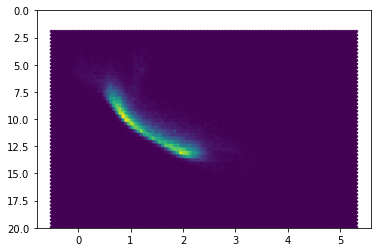

In [223]:
import matplotlib.pyplot as plt 
plt.hexbin(BpRp,Mg)
ymin, ymax = plt.ylim(20,0)

In [224]:
def value(s):
    try:
        return float(s)
    except ValueError:
        return 0

In [225]:
data = np.loadtxt('/Users/edm/Desktop/Gaia data/EEM_dwarf_UBVIJHK_colors_Teff.txt',usecols=(11), comments='#',dtype='str',  converters={11: value})
#does not print with ... so hd to replace with 0's

In [226]:
data = data.astype('float64')

In [227]:
print(data)
len(data)

[ 0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00
  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00
  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00
  0.00e+00  0.00e+00  0.00e+00 -1.20e-01 -8.70e-02 -3.70e-02  5.00e-03
  6.80e-02  1.10e-01  1.66e-01  1.94e-01  2.22e-01  2.63e-01  3.20e-01
  3.27e-01  3.77e-01  4.34e-01  4.90e-01  5.18e-01  5.46e-01  5.87e-01
  6.40e-01  6.70e-01  6.94e-01  7.19e-01  7.67e-01  7.84e-01  8.03e-01
  8.23e-01  8.32e-01  8.41e-01  8.50e-01  8.69e-01  8.80e-01  9.00e-01
  9.50e-01  9.83e-01  1.01e+00  1.10e+00  1.21e+00  1.34e+00  1.43e+00
  1.53e+00  1.70e+00  1.73e+00  1.79e+00  1.84e+00  1.97e+00  2.09e+00
  2.13e+00  2.23e+00  2.39e+00  2.50e+00  2.78e+00  2.94e+00  3.16e+00
  3.35e+00  3.71e+00  4.16e+00  4.50e+00  4.65e+00  4.72e+00  4.86e+00
  5.10e+00  4.78e+00  4.86e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00
  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00  0.00e+00
  0.00

118

In [228]:
def value2(s2):
    try:
        return float(s2)
    except ValueError:
        return 0

In [229]:
data2 = np.loadtxt('/Users/edm/Desktop/Gaia data/EEM_dwarf_UBVIJHK_colors_Teff.txt',usecols=(30), comments='#',dtype='str',  converters={30: value2})


In [230]:
data2 = data2.astype('float64')
data21 = np.asarray(data2)
data11 = np.asarray(data)
new_data = data21[6 : 69]
print(new_data)
len(new_data)

new_data2 = data11[24 : 87]
print(new_data2)
len(new_data2)

[27.    25.    23.    21.3   19.8   18.5   17.7   15.    11.    10.
  7.3    6.     5.4    5.1    4.7    4.3    3.92   3.38   2.75   2.68
  2.18   2.05   1.98   1.86   1.93   1.88   1.83   1.77   1.81   1.75
  1.61   1.5    1.46   1.44   1.38   1.33   1.25   1.21   1.18   1.13
  1.08   1.06   1.03   1.     0.99   0.985  0.98   0.97   0.95   0.94
  0.9    0.88   0.86   0.82   0.78   0.73   0.7    0.69   0.64   0.62
  0.59   0.57   0.54 ]
[-1.20e-01 -8.70e-02 -3.70e-02  5.00e-03  6.80e-02  1.10e-01  1.66e-01
  1.94e-01  2.22e-01  2.63e-01  3.20e-01  3.27e-01  3.77e-01  4.34e-01
  4.90e-01  5.18e-01  5.46e-01  5.87e-01  6.40e-01  6.70e-01  6.94e-01
  7.19e-01  7.67e-01  7.84e-01  8.03e-01  8.23e-01  8.32e-01  8.41e-01
  8.50e-01  8.69e-01  8.80e-01  9.00e-01  9.50e-01  9.83e-01  1.01e+00
  1.10e+00  1.21e+00  1.34e+00  1.43e+00  1.53e+00  1.70e+00  1.73e+00
  1.79e+00  1.84e+00  1.97e+00  2.09e+00  2.13e+00  2.23e+00  2.39e+00
  2.50e+00  2.78e+00  2.94e+00  3.16e+00  3.35e+00  3.71e+00  

63

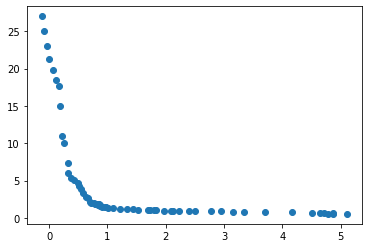

In [231]:
#concatanating 1d arrays code does not iterate over float
scatter = plt.scatter(new_data2,new_data)

In [232]:
def exponential(x, a, k, b):
    return a*np.exp(x*k) + b

In [233]:
popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, new_data2, new_data, p0=[1,-0.5, 1])

In [234]:
perr_exponential = np.sqrt(np.diag(pcov_exponential))
print("pre-exponential factor = %0.2f (+/-) %0.2f" % (popt_exponential[0], perr_exponential[0]))
print("rate constant = %0.2f (+/-) %0.2f" % (popt_exponential[1], perr_exponential[1]))

pre-exponential factor = 20.38 (+/-) 0.46
rate constant = -2.92 (+/-) 0.13


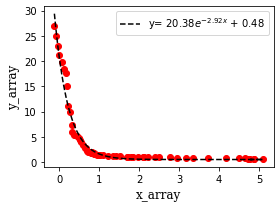

In [235]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import scipy as scipy
from scipy import optimize

from matplotlib import gridspec
import matplotlib.ticker as ticker
%matplotlib inline
fig = plt.figure(figsize=(4,3))
gs = gridspec.GridSpec(1,1)
ax1 = fig.add_subplot(gs[0])

ax1.plot(new_data2, new_data, "ro")
ax1.plot(new_data2, exponential(new_data2, *popt_exponential), 'k--', \
         label="y= %0.2f$e^{%0.2fx}$ + %0.2f" % (popt_exponential[0], popt_exponential[1], popt_exponential[2]))


ax1.set_xlabel("x_array",family="serif",  fontsize=12)
ax1.set_ylabel("y_array",family="serif",  fontsize=12)

ax1.legend(loc='best')



fig.tight_layout()
fig.savefig("fittedExponential.png", format="png",dpi=1000)


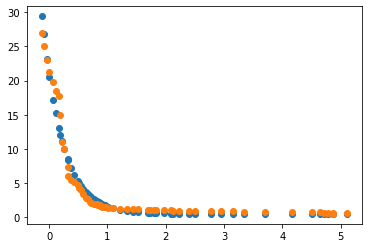

In [236]:
import math
#y = 20.38*np.exp(-2.92*x) + .48
#equation to approximate the mass

plt.scatter(new_data2, 20.38*np.exp(-2.92*new_data2) + .48)
scatter = plt.scatter(new_data2,new_data)

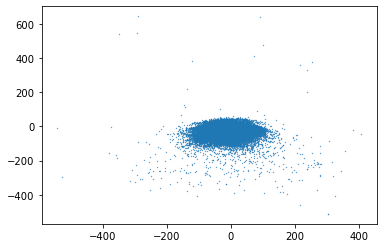

In [237]:
import matplotlib.pyplot as plt
plt.scatter(MVx, MVy, .1)

In [238]:
#transverse velocity
Tvel = (4.74047)*((np.sqrt((PMR**2) + (PMD**2)))/(Para))
new_Tvel = Tvel[52601 : ]
print(new_Tvel)
len(new_Tvel)

[3.73663442e+01 1.79295388e+01 1.60563432e+02 1.69435212e+01
 1.71837224e+01 8.40030494e+00 3.48472669e+01 2.50925032e+01
 7.59292761e+01 1.04847209e+02 2.02669298e+00 5.21229903e+01
 1.70736105e+01 5.40158350e+01 3.56610737e+01 1.26416373e+02
 3.02574991e+01 1.21102382e+01 2.66931311e+01 3.68717098e+01
 6.96482591e+01 2.08133460e+01 2.82554645e+01 7.36357416e+01
 2.87280841e+01 2.92733403e+01 4.11755294e+01 3.88108269e+01
 8.54131031e+01 1.82608670e+01 2.82364472e+01 9.68737088e+01
 9.80074373e+01 2.37852162e+01 4.01350481e+01 2.22175377e+01
 1.97817024e+01 2.77651477e+01 3.42266064e+01 2.94936734e+01
 3.75452951e+01 2.76612490e+01 5.19997629e+01 7.11665635e+01
 4.10398765e+01 4.34527125e+01 8.70348141e+01 1.26968509e+02
 1.96378921e+01 2.82146298e+01 4.25909567e+01 1.77522281e+01
 1.75431096e+01 5.48238846e+01 3.45566920e+00 5.42307158e+01
 9.42086882e+01 3.58121871e+01 8.88817094e+01 5.94107081e+01
 6.09299563e+00 2.23377008e+01 3.01817238e+01 5.36081357e+00
 3.44010204e+01 1.015752

28724

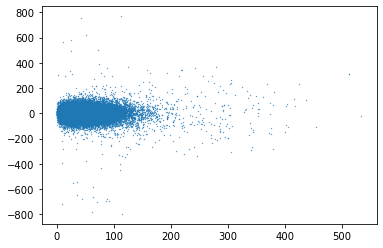

In [239]:
plt.scatter(Tvel, Rvel, .1)

In [240]:
vel = np.sqrt(Tvel**2 + Rvel**2)

Text(0, 0.5, 'd/pc')

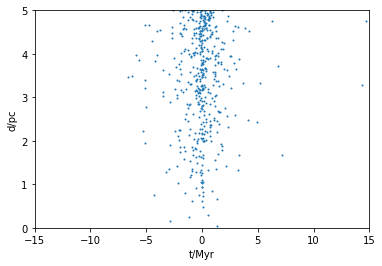

In [241]:

t = (-(10**3/Para))*(Rvel/(vel**2))

#Dont forget to make sure units work out
d = (10**3)*(1/Para)*(Tvel/(vel))
plt.scatter(t,d,1)

xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)

plt.xlabel("t/Myr")
plt.ylabel("d/pc")

In [242]:
len(d)

81325

In [243]:
len(t)

81325

In [244]:
#equation to find mass
y = (20.38*np.exp(-2.92*BpRp) + .48)
print(y)

[88.44873118 41.55518845 39.33352055 38.71456157 37.52122864 34.03861233
 33.54502218 32.83285064 32.72475917 31.85059609 31.78693316 31.66380058
 31.29602318 30.41958123 29.6350142  29.50623836 29.45447285 29.31096629
 29.17737823 29.1338874  29.01651444 28.94865074 28.75115242 28.36093238
 28.17595307 28.15070819 28.02137027 27.51662715 27.27127481 27.25788509
 27.10511427 27.03791839 26.88280958 26.87087778 26.82492761 26.79871618
 26.70569952 26.37523181 26.356849   26.27410692 26.22942137 26.09223861
 25.80251669 25.73703735 25.67038121 25.57368678 25.55256358 25.4366524
 25.32952585 25.22282302 25.08190669 25.01716581 24.77983888 24.7633615
 24.67734044 24.66840407 24.60763972 24.54987435 24.51263157 24.48384889
 24.44443393 23.95729697 23.87314764 23.85489604 23.78433866 23.68483318
 23.68408785 23.67794998 23.64899651 23.59621936 23.55591017 23.52704846
 23.44551419 23.43269603 23.39708146 23.39036389 23.33289689 23.3148801
 23.27328438 23.26262454 23.20094612 23.15359192 23.14

In [35]:
#0.62498529
mass = pd.DataFrame(y, columns = ['source mass'])
mass.columns()
gliese = mass.loc[mass['source mass'] == 88.448731]
print(mass)


TypeError: 'Index' object is not callable

In [245]:
import matplotlib.pyplot as plt
import pandas as pd

In [246]:
#area = (1.35)/(14.5*0.000068)
#df = pd.DataFrame({'T': t,'D': d,"bubble_size":area})


Text(0, 0.5, 'perihelion (d)/pc')

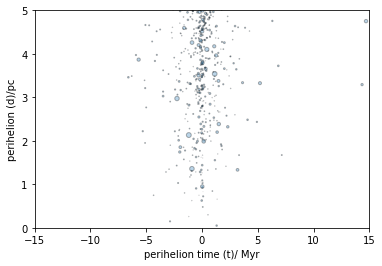

In [257]:

area = (y)/(med_d*med_v)
plt.scatter(t, d, area, alpha = .3, edgecolor = 'black')
#plt.scatter(t,d,1)
xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)
plt.xlabel("perihelion time (t)/ Myr")
plt.ylabel("perihelion (d)/pc")

In [259]:
max(y)
maxElement = np.amax(y)
print('Max element from Numpy Array : ', maxElement)

Max element from Numpy Array :  88.44873117649432


In [248]:
max(med_v)

707.1458124202322

In [260]:
maxarea = np.argmax(area)
print(maxarea)

5065


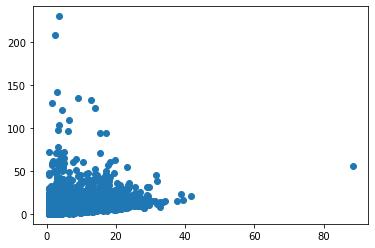

In [250]:
plt.scatter(y,area)

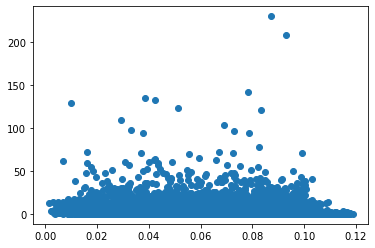

In [251]:
plt.scatter(med_d, area)

In [252]:
area_new = np.asarray(area)

In [253]:
maxElement = np.amax(area_new)
print('Max element from Numpy Array : ', maxElement)

Max element from Numpy Array :  230.10735716696558


In [254]:
area2 = (y/(med_v*(med_d**2)))
df = pd.DataFrame({'T': t,'D': d, "bubble_size":area2})

Text(0, 0.5, 'perihelion (d)/pc)')

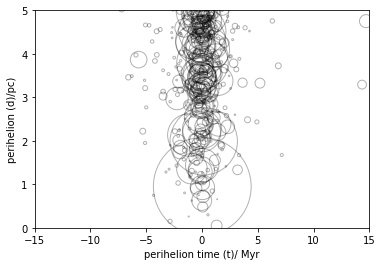

In [256]:
plt.scatter(t, d, area2, alpha = .3, edgecolor = 'black', facecolor = 'none')
#plt.scatter(t,d,1)
xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)
plt.xlabel("perihelion time (t)/ Myr")
plt.ylabel("perihelion (d)/pc)")

In [47]:
max(new_mass)

NameError: name 'new_mass' is not defined

In [48]:
max(area)

230.10735716696558

In [49]:
print(x)

NameError: name 'x' is not defined

In [50]:
print(BpRp)

[-5.0083130e-01 -4.9483500e-01 -4.8364600e-01 -4.8038800e-01
 -4.7617000e-01 -4.5231300e-01 -4.1525900e-01 -4.1508700e-01
 -4.0558100e-01 -3.9109000e-01 -3.8617500e-01 -3.6797500e-01
 -3.6732600e-01 -3.5228700e-01 -3.4856200e-01 -3.4775900e-01
 -3.4680800e-01 -3.3927400e-01 -3.3648350e-01 -3.3619900e-01
 -3.3193600e-01 -3.2500300e-01 -3.2391300e-01 -3.2029600e-01
 -3.2010400e-01 -3.1971500e-01 -3.1370200e-01 -3.1044200e-01
 -3.1001200e-01 -3.0908100e-01 -3.0873000e-01 -3.0834900e-01
 -3.0538300e-01 -2.9940500e-01 -2.9527200e-01 -2.9449300e-01
 -2.9131200e-01 -2.8786300e-01 -2.8698800e-01 -2.8681900e-01
 -2.8236200e-01 -2.8226600e-01 -2.7856500e-01 -2.7805200e-01
 -2.7543300e-01 -2.7473100e-01 -2.7463750e-01 -2.7377600e-01
 -2.7276050e-01 -2.6828000e-01 -2.6767250e-01 -2.6617200e-01
 -2.6556000e-01 -2.6497600e-01 -2.6387200e-01 -2.6370000e-01
 -2.6349300e-01 -2.6261200e-01 -2.6072700e-01 -2.6035800e-01
 -2.5618100e-01 -2.5363300e-01 -2.5210400e-01 -2.5126600e-01
 -2.5056300e-01 -2.50240

In [52]:
ID = np.asarray(star2["SOURCE_ID"])
BpRp = np.asarray(Bp - Rp)

In [53]:
BpRpID = np.append(ID, BpRp)

In [54]:
print(BpRpID)

[ 6.31124612e+18  5.26741888e+18  6.44332822e+18  6.00976003e+18
  2.52186781e+18  3.34807163e+18  2.33827514e+18  5.01400935e+18
  6.61631346e+18  6.46862369e+18  3.97486864e+18  3.37034245e+18
  2.37247366e+18  4.71678727e+18  2.65417074e+18  2.58138008e+18
  1.57914709e+18  3.52334774e+18  1.05527354e+18  5.07544398e+18
  7.57831217e+16  3.19126914e+18  6.75341345e+18  1.28141078e+18
  5.07807484e+18  3.83068085e+18  5.06353995e+18  2.39354625e+18
  4.96219339e+18  2.73431909e+18  4.42643587e+18  3.70507076e+18
  2.56794432e+18  1.87914756e+18  9.43770758e+17  6.76208971e+16
  9.28079146e+17  1.28998690e+18  1.19276413e+18  3.30672261e+18
  2.31534616e+18  5.13258086e+18  1.68670805e+18  6.87693441e+18
  1.83155338e+18  5.03787546e+18  3.69549569e+18  8.34234386e+17
  3.46632658e+18  1.38765552e+18  5.04392682e+18  6.18234573e+18
  2.81188207e+18  2.78939878e+18  3.69887216e+18  3.94095521e+18
  5.66795723e+18  1.26175172e+18  3.82936607e+18  3.63415153e+18
  1.51776053e+18  2.47633

In [268]:
maxarea = np.argmax(area2)
print(maxarea)
#returns index of max area

25624


In [56]:

import requests

In [57]:
r = requests.get('http://svocats.cab.inta-csic.es/wdw1/index.php?action=search')
print(r.content)

b'<html>\n<head>\n<link rel="stylesheet" href="./style/style.css" type="text/css" />\n<link rel="stylesheet" href="../common/style/style.css" type="text/css" />\n<title>White dwarfs from Gaia-DR2 and the VO,  by Jim\xc3\xa9nez-Esteban et al. 2018\r\n </title>\n</head>\n<body>\n<script language="JavaScript" src="javascript/wz_tooltip.js" ></script>\n<script language="JavaScript" src="javascript/showhide.js" ></script>\n\n\n<div id="cat_div_header">\n<h2>White dwarfs from Gaia-DR2 and the VO,  by Jim\xc3\xa9nez-Esteban et al. 2018\r\n</h2><h3></h3></div>\n\n\n<div id="cat_div_logos">\n<table width="100%"><tr><td align=left width=100><a href="http://svo.cab.inta-csic.es/" target="_blank"><img src="style/images/logo_svo.png"></a></td><td align=left width=100><a href="http://www.cab.inta-csic.es/" target="_blank"><img src="style/images/logo_cab.png"></a></td><td align=left width=100><a href="https://www.upc.edu/" target="_blank"><img src="style/images/logo-upc.png"></a></td></tr></table></d

In [58]:
dat = Table.read('/Users/edm/Desktop/Gaia data/gaiaedr3_wd_new.fits', format='fits')
df = dat.to_pandas()
df.columns
print(dat)

       WDJ_name             source_id      ...        pmdec           bp_rp    
                                           ...       mas / yr          mag     
---------------------- ------------------- ... ------------------- ------------
WDJ235959.90+512337.51 1944058569339736192 ...  -8.800981821036489   0.16509438
WDJ235959.69-135251.65 2420719915364707968 ... -18.436447040752892   0.39977074
WDJ235959.49-034703.60 2447840091218362368 ...   5.291213525458886     0.221838
WDJ235959.48+082813.10 2747056684475100544 ...  -5.631108669599367  -0.14219475
WDJ235959.36+052050.44 2744979024112132992 ...  -5.861379723593901    0.7715416
WDJ235958.84-213149.25 2341341841628763520 ... -15.839806358556425   0.14842224
WDJ235958.62+301622.51 2873304808599755520 ...    3.92835536313933 -0.017185211
WDJ235958.57+604756.02 2011631259747817344 ... -11.059568289654814   0.54229546
WDJ235958.39+121251.83 2766905927373173632 ...   8.167585505451337 -0.042966843
WDJ235958.22-443327.63 65325065813120544

In [59]:
import numpy as np
ID3 = np.asarray(star2["SOURCE_ID"])
#print(ID3)
df = pd.DataFrame(ID3, columns = ['SOURCE_ID'])
df['row_num'] = np.arange(len(df))

#print(df)


In [60]:
df.shape

(82130, 2)

In [61]:
WDID3 = np.asarray(dat["source_id"])
WDIDF3 = pd.DataFrame(WDID3, columns = ['SOURCE_ID'])

print(WDIDF3)
#print(WDID3)

                   SOURCE_ID
0        1944058569339736192
1        2420719915364707968
2        2447840091218362368
3        2747056684475100544
4        2744979024112132992
...                      ...
1280261   386745999526937472
1280262  2740440270176901632
1280263   384905313981247488
1280264  2443202660409662208
1280265  2334982270668338432

[1280266 rows x 1 columns]


In [62]:
WDIDF3.shape

(1280266, 1)

In [109]:
WD = np.array(np.intersect1d(ID3, WDID3))
WDF = pd.DataFrame(ID3, columns = ['SOURCE_ID'])

print(type(WDF))
print(type(WD))
x = len(WD)
print(x)
print(WD)


<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>
805
[  12254267546754176   14141304376849280   17033153101264640
   36207059639735296   39305036729495936   49013483883923968
   59077760488621184   59370127502651264   61497407625478272
   67620897117741440   75783121685634816   90076974709491968
   91690164426711040   98075028448822656   98092934167683072
  114851999635497344  181170585358665088  190998058945380608
  290678477446232960  291057843317534464  379359102453525376
  418491412783587200  470826482637310848  495058241441193728
  518201792978858880  575658456708126208  577026966432521088
  582509956042253312  582729312907277568  583533124626862464
  583995091309178624  584402318633098624  587767202170593536
  588332900903805824  588349771535238912  588349805894986624
  588813460499195264  591040864898749312  591207406550605312
  592019425952313600  592605431290049152  597646245427109376
  610478649930041856  627412945768300800  642685200933153408
  65133794512801472

In [266]:
WD = np.array(np.intersect1d(ID3, WDID3))

In [141]:

converted_list = [str(element) for element in WD]

joined_string = ", ".join(converted_list)
print(joined_string)

12254267546754176, 14141304376849280, 17033153101264640, 36207059639735296, 39305036729495936, 49013483883923968, 59077760488621184, 59370127502651264, 61497407625478272, 67620897117741440, 75783121685634816, 90076974709491968, 91690164426711040, 98075028448822656, 98092934167683072, 114851999635497344, 181170585358665088, 190998058945380608, 290678477446232960, 291057843317534464, 379359102453525376, 418491412783587200, 470826482637310848, 495058241441193728, 518201792978858880, 575658456708126208, 577026966432521088, 582509956042253312, 582729312907277568, 583533124626862464, 583995091309178624, 584402318633098624, 587767202170593536, 588332900903805824, 588349771535238912, 588349805894986624, 588813460499195264, 591040864898749312, 591207406550605312, 592019425952313600, 592605431290049152, 597646245427109376, 610478649930041856, 627412945768300800, 642685200933153408, 651337945128014720, 674479430781455872, 677196843705878272, 677560232299128192, 679723276611814400, 681934703732973

In [100]:
for i in range (0, len(fd)):
    if i != WDF['SOURCE_ID']:
        print(YES)
    else:
        print(no)

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [99]:
mask = np.zeros(len(fd['SOURCE_ID']))
for w in WD:
    mask+=fd['SOURCE_ID']==w

[mask]
    

[0        0.0
 1        1.0
 2        1.0
 3        1.0
 4        1.0
         ... 
 82128    0.0
 82129    0.0
 82130    0.0
 82131    0.0
 82132    0.0
 Name: SOURCE_ID, Length: 82133, dtype: float64]

In [ ]:
mask.drop()

In [88]:
mask = np.zeros(len(fd['SOURCE_ID']))

In [ ]:
df[mask]

In [74]:
mask = BpRp < 1

In [78]:
print(mask)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  T

In [79]:
BpRp[~mask]

array([1.000021 , 1.00004  , 1.00004  , 1.000049 , 1.000144 , 1.000153 ,
       1.000162 , 1.000181 , 1.000219 , 1.0002333, 1.000246 , 1.000248 ,
       1.000248 , 1.000249 , 1.000264 , 1.000272 , 1.000285 , 1.000324 ,
       1.000339 , 1.000379 , 1.000401 , 1.000441 , 1.000442 , 1.0004475,
       1.000454 , 1.000475 , 1.000511 , 1.000542 , 1.0005444, 1.000548 ,
       1.00063  , 1.000653 , 1.000655 , 1.000662 , 1.000665 , 1.000666 ,
       1.000677 , 1.000704 , 1.0007094, 1.000737 , 1.000769 , 1.000786 ,
       1.0008045, 1.0008095, 1.000824 , 1.000825 , 1.000832 , 1.000849 ,
       1.000878 , 1.0009532, 1.0009704, 1.000977 , 1.0009793, 1.001011 ,
       1.001011 , 1.001013 , 1.001038 , 1.001053 , 1.001063 , 1.00107  ,
       1.001084 , 1.001086 , 1.001139 , 1.001175 , 1.001212 , 1.0012225,
       1.001225 , 1.00123  , 1.00124  , 1.00124  , 1.001241 , 1.001246 ,
       1.0013044, 1.001324 , 1.001325 , 1.0013303, 1.001364 , 1.001387 ,
       1.001392 , 1.001415 , 1.001419 , 1.0014293, 